In [23]:
import os
import glob
import numpy as np
from scipy import signal
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import pandas as pd
import seaborn as sns
import copy
import pickle


%matplotlib inline

In [61]:
working_directory = r"D:\Files_Reutlingen_Jenny\19-04-16\190416_paper\spike_extraction"

output_directory = r"D:\Files_Reutlingen_Jenny\19-04-16\190416_paper\new_analysis_02_HCx_GFP_B_hCSF_base"

In [25]:
os.chdir(working_directory)

In [26]:
filename= '02_HCx_GFP_B_hCSF'

In [27]:
Basics = {}
Infos_Recording = {}
Infos_Analysis = {}
Infos_Anatomy = {}
main_recording_dictionary ={}

In [28]:
medium = 'hCSF'
recordingdate = '16.04.2019'

In [29]:
Infos_Recording['medium']=medium


In [30]:
folderlist = glob.glob(filename+'*')

In [31]:
folderlist

['02_HCx_GFP_B_hCSF_from_0_to_120_analyzed_on_14102021',
 '02_HCx_GFP_B_hCSF_from_1080_to_1200_analyzed_on_14102021',
 '02_HCx_GFP_B_hCSF_from_1200_to_1320_analyzed_on_14102021',
 '02_HCx_GFP_B_hCSF_from_120_to_240_analyzed_on_14102021',
 '02_HCx_GFP_B_hCSF_from_1320_to_1440_analyzed_on_14102021',
 '02_HCx_GFP_B_hCSF_from_1440_to_1560_analyzed_on_14102021',
 '02_HCx_GFP_B_hCSF_from_1560_to_1680_analyzed_on_14102021',
 '02_HCx_GFP_B_hCSF_from_1680_to_1800_analyzed_on_14102021',
 '02_HCx_GFP_B_hCSF_from_240_to_360_analyzed_on_14102021',
 '02_HCx_GFP_B_hCSF_from_360_to_480_analyzed_on_14102021',
 '02_HCx_GFP_B_hCSF_from_480_to_600_analyzed_on_14102021',
 '02_HCx_GFP_B_hCSF_from_600_to_720_analyzed_on_14102021',
 '02_HCx_GFP_B_hCSF_from_720_to_840_analyzed_on_14102021',
 '02_HCx_GFP_B_hCSF_from_840_to_960_analyzed_on_14102021',
 '02_HCx_GFP_B_hCSF_from_960_to_1080_analyzed_on_14102021']

In [32]:
folderlist

['02_HCx_GFP_B_hCSF_from_0_to_120_analyzed_on_14102021',
 '02_HCx_GFP_B_hCSF_from_1080_to_1200_analyzed_on_14102021',
 '02_HCx_GFP_B_hCSF_from_1200_to_1320_analyzed_on_14102021',
 '02_HCx_GFP_B_hCSF_from_120_to_240_analyzed_on_14102021',
 '02_HCx_GFP_B_hCSF_from_1320_to_1440_analyzed_on_14102021',
 '02_HCx_GFP_B_hCSF_from_1440_to_1560_analyzed_on_14102021',
 '02_HCx_GFP_B_hCSF_from_1560_to_1680_analyzed_on_14102021',
 '02_HCx_GFP_B_hCSF_from_1680_to_1800_analyzed_on_14102021',
 '02_HCx_GFP_B_hCSF_from_240_to_360_analyzed_on_14102021',
 '02_HCx_GFP_B_hCSF_from_360_to_480_analyzed_on_14102021',
 '02_HCx_GFP_B_hCSF_from_480_to_600_analyzed_on_14102021',
 '02_HCx_GFP_B_hCSF_from_600_to_720_analyzed_on_14102021',
 '02_HCx_GFP_B_hCSF_from_720_to_840_analyzed_on_14102021',
 '02_HCx_GFP_B_hCSF_from_840_to_960_analyzed_on_14102021',
 '02_HCx_GFP_B_hCSF_from_960_to_1080_analyzed_on_14102021']

In [50]:
# get into every folder and find the dictionaries
# replace them in a two meta-dictionaries (infodics and spikedics)
infodics = {}
spikedics = {}

for folder in folderlist:
    os.chdir(os.path.join(working_directory, folder))
    timekey = folder.split('_')[6:9]
    timekey = '_'.join(timekey)
    
    # load the info_dic_file
    info_dic_filename = glob.glob('*info*npy')
    print(info_dic_filename)
    print(os.getcwd())
    info_dic = np.load(info_dic_filename[0], allow_pickle=True).item()
    infodics[timekey] = info_dic
    
    # load the spikedic_file
    spike_dic_filename = glob.glob('*spikes_MAD*')[0]
    spikedic_MAD = np.load(spike_dic_filename, allow_pickle=True).item()
    spikedics[timekey] = spikedic_MAD
    


['02_HCx_GFP_B_hCSF.h5_0_120_info_dict.npy']
D:\Files_Reutlingen_Jenny\19-04-16\190416_paper\spike_extraction\02_HCx_GFP_B_hCSF_from_0_to_120_analyzed_on_14102021
['02_HCx_GFP_B_hCSF.h5_1080_1200_info_dict.npy']
D:\Files_Reutlingen_Jenny\19-04-16\190416_paper\spike_extraction\02_HCx_GFP_B_hCSF_from_1080_to_1200_analyzed_on_14102021
['02_HCx_GFP_B_hCSF.h5_1200_1320_info_dict.npy']
D:\Files_Reutlingen_Jenny\19-04-16\190416_paper\spike_extraction\02_HCx_GFP_B_hCSF_from_1200_to_1320_analyzed_on_14102021
['02_HCx_GFP_B_hCSF.h5_120_240_info_dict.npy']
D:\Files_Reutlingen_Jenny\19-04-16\190416_paper\spike_extraction\02_HCx_GFP_B_hCSF_from_120_to_240_analyzed_on_14102021
['02_HCx_GFP_B_hCSF.h5_1320_1440_info_dict.npy']
D:\Files_Reutlingen_Jenny\19-04-16\190416_paper\spike_extraction\02_HCx_GFP_B_hCSF_from_1320_to_1440_analyzed_on_14102021
['02_HCx_GFP_B_hCSF.h5_1440_1560_info_dict.npy']
D:\Files_Reutlingen_Jenny\19-04-16\190416_paper\spike_extraction\02_HCx_GFP_B_hCSF_from_1440_to_1560_analyze

In [51]:
infodics

{'0_to_120': {'tick': 40,
  'timelengthrecording_s': 1800.0,
  'first_recording_timepoint': 0,
  'scale_factor_for_second': 1e-06,
  'network_burst_threshold_basline': 431.65977114692873},
 '1080_to_1200': {'tick': 40,
  'timelengthrecording_s': 1800.0,
  'first_recording_timepoint': 0,
  'scale_factor_for_second': 1e-06,
  'network_burst_threshold_basline': 534.0496683643315},
 '1200_to_1320': {'tick': 40,
  'timelengthrecording_s': 1800.0,
  'first_recording_timepoint': 0,
  'scale_factor_for_second': 1e-06,
  'network_burst_threshold_basline': 509.54410311594637},
 '120_to_240': {'tick': 40,
  'timelengthrecording_s': 1800.0,
  'first_recording_timepoint': 0,
  'scale_factor_for_second': 1e-06,
  'network_burst_threshold_basline': 381.58164333698005},
 '1320_to_1440': {'tick': 40,
  'timelengthrecording_s': 1800.0,
  'first_recording_timepoint': 0,
  'scale_factor_for_second': 1e-06,
  'network_burst_threshold_basline': 513.1696488813595},
 '1440_to_1560': {'tick': 40,
  'timelength

In [52]:
info_dic = np.load(info_dic_filename[0], allow_pickle=True).item()

In [53]:
np.save('infodics_'+filename+'.npy', infodics)

In [54]:
infodics = np.load("infodics_"+filename+".npy", allow_pickle=True).item()

In [55]:
info_dic = infodics['0_to_120']

In [56]:
infodics

{'0_to_120': {'tick': 40,
  'timelengthrecording_s': 1800.0,
  'first_recording_timepoint': 0,
  'scale_factor_for_second': 1e-06,
  'network_burst_threshold_basline': 431.65977114692873},
 '1080_to_1200': {'tick': 40,
  'timelengthrecording_s': 1800.0,
  'first_recording_timepoint': 0,
  'scale_factor_for_second': 1e-06,
  'network_burst_threshold_basline': 534.0496683643315},
 '1200_to_1320': {'tick': 40,
  'timelengthrecording_s': 1800.0,
  'first_recording_timepoint': 0,
  'scale_factor_for_second': 1e-06,
  'network_burst_threshold_basline': 509.54410311594637},
 '120_to_240': {'tick': 40,
  'timelengthrecording_s': 1800.0,
  'first_recording_timepoint': 0,
  'scale_factor_for_second': 1e-06,
  'network_burst_threshold_basline': 381.58164333698005},
 '1320_to_1440': {'tick': 40,
  'timelengthrecording_s': 1800.0,
  'first_recording_timepoint': 0,
  'scale_factor_for_second': 1e-06,
  'network_burst_threshold_basline': 513.1696488813595},
 '1440_to_1560': {'tick': 40,
  'timelength

In [57]:
Infos_Recording = {}
Infos_Recording['info_dics_subrecordings'] = infodics
Infos_Recording['recordings_date'] = recordingdate
Infos_Recording['timelengthrecording_s'] = info_dic['timelengthrecording_s']
#recording lenght 



In [58]:
os.getcwd()

'D:\\Files_Reutlingen_Jenny\\19-04-16\\190416_paper\\spike_extraction\\02_HCx_GFP_B_hCSF_from_960_to_1080_analyzed_on_14102021'

In [62]:
with open(os.path.join(output_directory+'\\infodics_'+filename+'.pkl'), 'wb') as f:
    pickle.dump(infodics, f)

We now have the a dictionary of dictionaries for the info-dic and a dictionary of dictionaries for the spikedics.

Next, we want to rejoin the subdictionaries again.
    

In [63]:
# we gather the general information
infodic = infodics['0_to_120']

tick = infodic['tick']
# the timelength recording must be set to 120 seconds if we observe
timelengthrecording_s = 120
first_recording_timepoint = infodic['first_recording_timepoint']
scale_factor_for_second = infodic['scale_factor_for_second']




In [64]:
Infos_Recording['scale_factor_for_second'] = scale_factor_for_second
Infos_Recording['tick'] = tick

In [65]:
# cross this out if you want them in the original directory
os.chdir(output_directory)

## Join a Subdivied Recording and prepare the analysis for the whole Recordings

Since threshold extraction of spikes is computationally extensive, we subidivided the original recording into two minute sets. We now want to rejoin these two minute sets and repeat the analysis as above:



In [90]:
filename = filename+'_completerecording'

In [91]:
infodic

timelengthrecording_s = info_dic['timelengthrecording_s']

In [92]:
info_dic

{'tick': 40,
 'timelengthrecording_s': 1800.0,
 'first_recording_timepoint': 0,
 'scale_factor_for_second': 1e-06,
 'network_burst_threshold_basline': 431.65977114692873}

In [93]:
spikedics

{'0_to_120': {'R12': array([   3397,   10247,   11961,   16154,   19497,   25268,   31876,
           37046,   38075,   42898,   48500,   62104,   69936,   73899,
           87502,   91573,  100056,  105449,  110584,  119108,  127454,
          148769,  153151,  160552,  160596,  166161,  171188,  178860,
          180257,  183235,  184912,  190315,  190364,  197381,  200799,
          205968,  206617,  208724,  213055,  219901,  224375,  224637,
          224684,  234140,  240692,  245687,  250246,  258300,  266067,
          267358,  270206,  275167,  283973,  290227,  295760,  300951,
          309400,  314733,  320004,  324494,  325544,  331787,  340380,
          341803,  355716,  359869,  365976,  372083,  378505,  378553,
          383729,  391914,  397067,  398496,  399679,  400773,  405470,
          409579,  410195,  413193,  418855,  425903,  429435,  431578,
          437199,  448956,  453249,  455570,  461547,  470761,  478847,
          483806,  489492,  494180,  497561, 

The spikedics we use are already containting spikes in the original tick value.
That means for the subdivided dictionaries the spiketrains don't start at zero again but when the subdivided dictionary starts.

In [94]:
timekeys = list(spikedics.keys())
channelkeys = list(spikedics[timekeys[0]].keys())

In [95]:
# we now need to use a double loop to get all dictionary keys and join them into a big full recording dictionary

spikedic_MAD_full = {}
temp_spikelist = []

for i in channelkeys:
    temp_spikelist = []
    for j in timekeys:
        spikes = list(spikedics[j][i])
        temp_spikelist.append(spikes)
    
    #join the lists
    temp_spikelista = sum(temp_spikelist, [])
    #remove the duplicates
    temp_spikelistb = list(set(temp_spikelista))
    
    #sort the list
    temp_spikelistc = sorted(temp_spikelistb)
    
    #assign them to their channel in the full dictionary
    spikedic_MAD_full[i] = temp_spikelistc

        

In [96]:
spikedic_MAD = spikedic_MAD_full

In [97]:
main_recording_dictionary['spikedic_MAD'] = spikedic_MAD

In [98]:
np.save(filename +'_full_spikedic.npy', spikedic_MAD_full)

Now the analysis can proceed just as before for the longer recording

In [99]:
 # create an array of the spikes in scale of seconds
active_channels = 0
spikedic_seconds = {}
for key in spikedic_MAD:
    relevant_factor = timelengthrecording_s*0.05
    if len(spikedic_MAD[key])>relevant_factor:
        sec_array = np.asarray(spikedic_MAD[key])*tick*scale_factor_for_second
        spikedic_seconds[key]=sec_array
        active_channels += 1
spikearray_seconds = np.asarray(list(spikedic_seconds.values()))  

C:\Users\User\anaconda3\lib\site-packages\numpy\core\_asarray.py:102: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  return array(a, dtype, copy=False, order=order)


In [100]:
Basics['active_channels'] = active_channels
Basics['relevant_factor'] = relevant_factor


In [101]:
# get a 1-D array with every detected spike
scale_factor_for_milisecond = 1e-03
full_spike_list = []
full_spike_list_seconds = []
for key in spikedic_MAD:
    if len(spikedic_MAD[key])>relevant_factor:
        x = list(np.asarray(spikedic_MAD[key])*scale_factor_for_milisecond*tick)
        full_spike_list = full_spike_list + x

        xs = list(np.asarray(spikedic_MAD[key])*scale_factor_for_second*tick)
        full_spike_list_seconds = full_spike_list_seconds + xs
full_spikes = sorted(full_spike_list)
full_spikes_seconds = sorted(full_spike_list_seconds)

In [102]:
mean_fr_whole_recording = np.around((len(full_spikes_seconds) / timelengthrecording_s), 3)

In [103]:
mean_fr_whole_recording

1456.711

In [104]:
Basics['mean_fr_whole_recording'] = mean_fr_whole_recording

In [105]:
Basics

{'active_channels': 224,
 'relevant_factor': 90.0,
 'mean_fr_whole_recording': 1456.711}

In [106]:
#define bins 
binsize = 0.005 #seconds
bins= np.arange(0, timelengthrecording_s+binsize, binsize)

# make a histogram 
full_spikes_binned = np.histogram(full_spikes_seconds, bins)[0]


#trial of population burst plot as inspired by Andrea Corna
bins = int(timelengthrecording_s / binsize)+1

firing_rate_histogram = np.histogram(full_spikes_seconds, bins=bins)
firing_rate = firing_rate_histogram[0]*200 #conversion to hertz

In [107]:
def gaussian_smoothing(y, window_size=10, sigma=2):

    filt = signal.gaussian(window_size, sigma)

    return signal.convolve(y, filt, mode='full')

In [108]:
len(np.ones(N)/N)

300

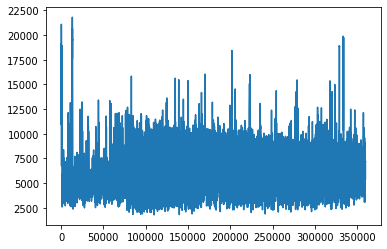

In [109]:
N = int(1/binsize) # für eine Secunde, das Sliding window, also letztlich number of bins

# gaussian smmothing fo the firing rate and moving average
fr_gau = gaussian_smoothing(firing_rate)
ma_fr_gau = np.convolve(fr_gau, np.ones(N)/N, mode='valid')
plt.plot(ma_fr_gau)

In [110]:
len(fr_gau)

360010

In [111]:
# we look for the mean of the MA as threshold
# we arrange this mean in an array for plotting
mean_ma_fr_gau = np.mean(ma_fr_gau)
std_ma_fr_gau = np.std(ma_fr_gau)
network_burst_threshold = mean_ma_fr_gau + 1*std_ma_fr_gau
shape_for_threshold = np.shape(ma_fr_gau)
network_burst_threshold_array = np.full(shape_for_threshold, network_burst_threshold)

### Network-Bursts Extraction in Seconds.

These Network Bursts will be the seconds we search for IID vs SPA.

In [112]:
# now we identify the burts from the network and will extract an array with 
# tuples containing the burst start and end times
bursts= []
burst_start = []
burst_seconds_start = []
burst_end = []
burst_seconds_end = []
for index in range(0, len(ma_fr_gau[:-N])):
    if ma_fr_gau[index+N] > network_burst_threshold:
        if ma_fr_gau[index+N-1] <= network_burst_threshold:
            burst_start.append(index+N)
            burst_seconds_start.append((index+N)*0.005)
        if index == 0:
            burst_start.append(0)
            burst_seconds_start.append((index+N)*0.005)
    else:
        if (ma_fr_gau[index+N-1] > network_burst_threshold) and (len(burst_start)>0):
            if index+N > len(ma_fr_gau):
                ending = len(ma_fr_gau)
            else: 
                ending = index + N

            burst_end.append(ending)
            burst_seconds_end.append((ending)*0.005)
bursts = list(zip(burst_start, burst_end))
bursts_seconds = list(zip(burst_seconds_start, burst_seconds_end))    

In [113]:
main_recording_dictionary['network_bursts_seconds'] = bursts_seconds

<ipython-input-114-6e1cc936eda7>:6: MatplotlibDeprecationWarning: "color" keyword argument will be ignored
  axs[1].eventplot(spikearray_seconds, color = 'black', linewidths = 0.01,


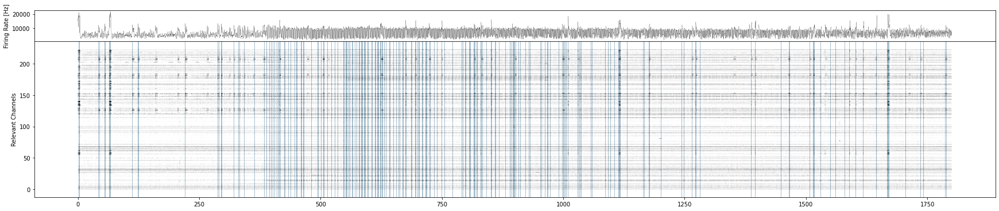

In [114]:
fig = plt.figure(figsize = (30,6))
gs = fig.add_gridspec(2, hspace = 0, height_ratios=[1,5])
axs = gs.subplots(sharex=False, sharey=False)
axs[0].plot(ma_fr_gau, color= 'black', linewidth = 0.2)
axs[0].set_ylabel('Firing Rate [Hz]')
axs[1].eventplot(spikearray_seconds, color = 'black', linewidths = 0.01,
                 linelengths = 1, colors = 'black')
axs[1].set_ylabel('Relevant Channels')

for ax in axs:
    for i in bursts_seconds:
        axs[1].axvspan(i[0], i[1], facecolor = '#5B89A6', alpha = 0.3)
#fig.savefig(filename+ '__raster_firingrate_plot.png', dpi=300)

In [115]:
# and lastly for the whole recording

whole_recording_firingrate_dic = {}

for key in spikedic_MAD:
    fr_channel = len(spikedic_MAD[key])/timelengthrecording_s # i.e, number of spikes divided by duration -> results in number per second
    whole_recording_firingrate_dic[key] = fr_channel

In [116]:
main_recording_dictionary['fr_dic'] = whole_recording_firingrate_dic

In [117]:
# for plotting with sns heatmap we need a df first 

# this is done as empty df:

mea_array=np.empty((16,16,))
mea_array[:]=np.nan
columnlist =['A','B','C','D','E','F','G','H','I','K','L','M','N','O','P','R']
df = pd.DataFrame(data=mea_array,columns=columnlist)
df.index+=1

In [118]:
plotframe = copy.deepcopy(df)

In [119]:
plotframe_filled = get_dict_values(plotframe, whole_recording_firingrate_dic)

NameError: name 'get_dict_values' is not defined

NameError: name 'plotframe_filled' is not defined

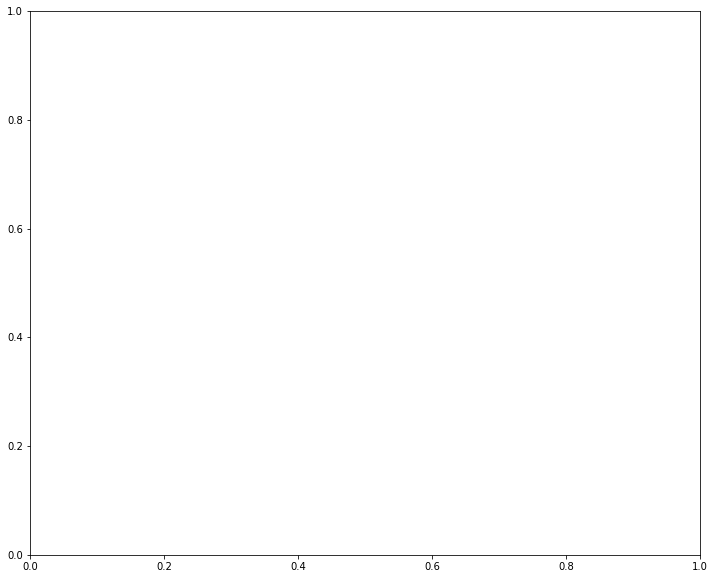

In [68]:
f, ax = plt.subplots(1, 1, figsize = (12,10))

sns.heatmap(plotframe_filled, annot=False, linewidths=.5, ax=ax, cmap="flare")
ax.set_title('firing/Channel ' + filename + ' Mean FR Active: {}, active channels: {}'.format(mean_fr_whole_recording, active_channels))

#f.savefig(filename+'whole_MEA_Heatmap.png', dpi = 300, bbox_inches = 'tight')

In [144]:
# normalize the plotframe:

plotframe_normalized =(plotframe_filled-plotframe_filled.mean().max())/plotframe_filled.mean().std()

<IPython.core.display.Javascript object>


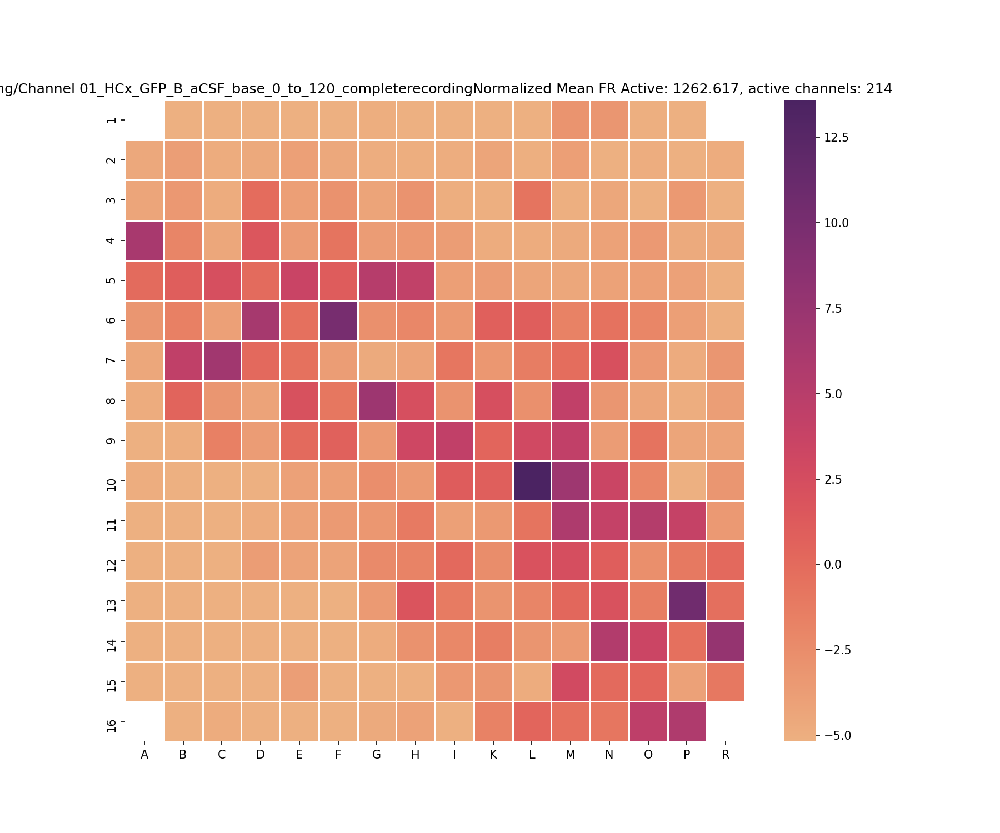

In [145]:
f, ax = plt.subplots(1, 1, figsize = (12,10))

sns.heatmap(plotframe_normalized, annot=False, linewidths=.5, ax=ax, cmap="flare")
ax.set_title('firing/Channel ' + filename + 'Normalized Mean FR Active: {}, active channels: {}'.format(mean_fr_whole_recording, active_channels))

f.savefig(filename+'whole_MEA_Heatmap_normalized.png', dpi = 300, bbox_inches = 'tight')

## basic spiking statistics

next from the whole 20 minute recording we want to calculate the average ISI intervals of the relevant channels and ISI standard deviations for every channel

In [121]:
def get_isi_single_channel(spikedic):
    
    '''
    input: 
        spikedic with keys = channellabels, values = spiketimes in raw ticks
    
    
    returns: 

        dictionary with keys = channellabels, values = isi per channel in miliseconds
        
        
    nota bene:
        the amount of spikes is not filtered, we still need to factor out non relevant channels
    
    '''
    
    # set the empty dictionary and temporary list
    isi_dictionary = {}
    isi_temp_list =[]
    
    
    for key in spikedic:
        isi_temp_list =[]
        spikes = spikedic[key]
        spikes = [spike * tick * scale_factor_for_milisecond for spike in spikes]
        
        if len(spikes) >= 2:
            for i in range(0, len(spikes)-1): 

                # calculate the isi
                isi =  spikes[i+1] - spikes[i] 
                isi_temp_list.append(isi)

        isi_dictionary[key] = isi_temp_list
        
    
    return isi_dictionary
        

In [122]:
# create the dictionary with isi
isi_dictionary = get_isi_single_channel(spikedic_MAD_full)


In [123]:
main_recording_dictionary['isi_dictionary'] = isi_dictionary

In [124]:
# now we get the average isi and isi std

# creating list to easily calculate the whole mean and std
isi_averages = []
isi_standarddeviations = []

# creat dictionaries to do the same for every channel
isi_average_dic = {}
isi_standarddeviations_dic = {}



for key in isi_dictionary:
    if len(isi_dictionary[key]) > relevant_factor:
        
        # for the relevant channels we attain the mean
        mean_isi = np.mean(isi_dictionary[key])
        isi_averages.append(mean_isi)
        
        # and the standard deviation
        std_isi = np.std(isi_dictionary[key])
        isi_standarddeviations.append(std_isi)
        
        isi_average_dic[key] = mean_isi
        isi_standarddeviations_dic[key] = std_isi
        
        
        
mean_isi_relevant_channels = np.mean(isi_averages)
mean_isi_std = np.mean(isi_standarddeviations)

In [125]:
main_recording_dictionary['isi_average_dic'] = isi_average_dic

In [126]:
# now we get the average isi and isi std

# creating list to easily calculate the whole mean and std
isi_averages = []
isi_standarddeviations = []

# creat dictionaries to do the same for every channel
isi_average_dic = {}
isi_standarddeviations_dic = {}

for key in isi_dictionary:
    if len(isi_dictionary[key]) > relevant_factor:
        
        # for the relevant channels we attain the mean
        mean_isi = np.mean(isi_dictionary[key])
        isi_averages.append(mean_isi)
        
        print(mean_isi)

218.49218067022827
74.29458839071918
278.1305162287481
102.90149571183532
72.31870112124744
242.09793084891697
82.02543647718467
3036.3905922165823
171.7161790247161
101.00889587426326
906.0706747230614
658.6064128843338
3900.7759101123597
474.7744283073673
60.52179977805429
73.81309985646915
1796.519175257732
720.5881683366733
923.990540958269
2145.290168674699
7579.830303030302
87.90140743272941
171.94439145839317
86.57053482108502
566.8718988941548
240.95740760578468
154.6208332617473
84.48511924882631
143.50278969614803
408.9697090909091
77.04365706458931
61.178723230675104
43.8265033364181
52.41260680898157
97.41610999837602
2734.680669710807
172.9263111367349
111.8399701659519
1337.2377049180327
1844.3892070030897
99.33647968197879
103.18145166838666
1073.3901075268818
8260.375283018868
1196.8017950435365
84.76096299093656
116.25545695278694
5693.760409556314
214.09154835636016
1158.5584784010314
66.46366738054796
3225.483243243243
245.3944978165939
143.45141352903636
4923.355726

In [127]:
isi_dictionary

{'R12': [274.0,
  68.56,
  167.71999999999997,
  133.72000000000003,
  230.84000000000003,
  264.31999999999994,
  206.79999999999995,
  41.16000000000008,
  192.92000000000007,
  224.07999999999993,
  544.1599999999999,
  313.2800000000002,
  158.51999999999998,
  544.1199999999999,
  162.84000000000015,
  339.32000000000016,
  215.7199999999998,
  205.39999999999964,
  340.96000000000004,
  333.84000000000015,
  852.6000000000004,
  175.27999999999975,
  296.03999999999996,
  1.7600000000002183,
  222.60000000000036,
  201.07999999999993,
  306.8800000000001,
  55.8799999999992,
  119.1200000000008,
  67.07999999999993,
  216.1199999999999,
  1.9600000000000364,
  280.6799999999994,
  136.72000000000025,
  206.7599999999993,
  25.960000000000946,
  84.28000000000065,
  173.23999999999978,
  273.84000000000015,
  178.95999999999913,
  10.479999999999563,
  1.8800000000010186,
  378.2399999999998,
  262.0799999999999,
  199.79999999999927,
  182.36000000000058,
  322.15999999999985,
  

In [128]:
mean_isi_std

2487.4778365344814

In [129]:
mean_fr_whole_recording

1456.711

In [130]:
active_channels

224

## reference to the anatomy



In [131]:
#layerdic 16.04.2019 B!!!
layerdic = {'layer1':[], 
            'layer2-3': ['F1', 'G1', 'H1', 'I1', 'K1', 'L1', 'M1', 'N1', 'O1', 'P1', 'H2', 'I2', 'K2', 'L2', 
                         'M2', 'N2', 'O2', 'P2', 'R2', 'K3', 'L3', 'M3', 'N3', 'O3', 'P3', 'R3', 'L4', 'M4', 
                         'N4', 'O4', 'P4', 'R4', 'N5', 'O5', 'P5', 'R5', 'P6', 'R6', 'R7'],
           'layer4':    ['D1', 'E1', 'F2', 'G2', 'G3', 'H3', 'I3', 'I4', 'K4', 'L5', 'M5', 'M6', 'N6', 'O6', 
                         'O7', 'P7', 'P8', 'R8'],
                         
           'layer5-6':  ['B1', 'C1', 'A2', 'B2', 'C2', 'D2', 'E2', 'A3', 'B3', 'C3', 'D3', 'E3', 'F3',
                         'A4', 'B4', 'C4', 'D4', 'E4', 'F4', 'G4', 'H4', 'A5', 'B5', 'C5', 'D5', 'E5', 
                         'F5', 'G5', 'H5', 'I5', 'A6', 'B6', 'C6', 'D6', 'E6', 'F6', 'G6', 'H6', 'I6', 
                         'K6', 'A7', 'B7', 'C7', 'D7', 'E7', 'F7', 'G7', 'H7', 'I7', 'K7', 'L7', 'M7', 
                         'N7', 'A8', 'B8', 'C8', 'D8', 'E8', 'F8', 'G8', 'H8', 'I8', 'K8', 'L8', 'M8', 
                         'N8', 'O8', 'B9', 'C9', 'D9', 'E9', 'F9', 'G9', 'H9', 'I9', 'K9', 'L9', 'M9', 
                         'N9', 'O9', 'P9', 'R9', 'C10', 'D10', 'E10', 'F10', 'G10', 'H10', 'I10', 'K10', 
                         'L10', 'M10', 'N10', 'O10', 'P10', 'R10', 'D11', 'E11', 'F11', 'G11', 'H11', 
                         'I11', 'K11', 'L11', 'M11', 'N11', 'O11', 'P11', 'R11', 'E12', 'F12', 'G12', 
                         'H12', 'I12', 'K12', 'L12', 'M12', 'N12', 'O12', 'P12', 'R12', 'F13', 'G13', 
                         'H13', 'I13', 'K13', 'L13', 'M13', 'N13', 'O13', 'P13', 'R13', 'G14', 'H14', 
                         'I14', 'K14', 'L14', 'M14', 'N14', 'O14', 'P14', 'R14', 'H15', 'I15', 'K15', 
                         'L15', 'M15', 'N15', 'O15', 'P15', 'R15', 'H16', 'I16', 'K16', 'L16', 'M16', 
                         'N16', 'O16', 'P16', 'R16'],
           'whitematter':['A9', 'A10', 'B10', 'A11', 'B11', 'C11', 'A12', 'B12', 'C12', 'D12', 'A13', 
                          'B13', 'C13', 'D13', 'E13', 'A14', 'B14', 'C14', 'D14', 'E14', 'F14', 'A15', 
                          'B15', 'C15', 'D15', 'E15', 'F15', 'G15', 'B16', 'C16', 'D16', 'E16', 'F16', 
                          'G16', 'H16']
                         }

In [132]:
def invert_layerdic(layer_dic):
    
    '''
    Expects a dictionary with key = layer, value = list of channellabels
    
    Returns a dictionary with key = channellabels, value = layer
    '''
    layerdic_invert = {}

    for key in layerdic:
        for i in layerdic[key]:
            layerdic_invert[i]=key
            
            
    return layerdic_invert

In [133]:
layerdic_invert = invert_layerdic(layerdic)

In [134]:
Infos_Anatomy['layerdic'] = layerdic
Infos_Anatomy['layerdic_invert'] = layerdic_invert




In [135]:
isi_standarddeviations_dic

{}

In [136]:
relevant_factor

90.0

In [137]:
Infos_Analysis['relevant_factor'] = relevant_factor

In [138]:
main_recording_dictionary.keys()

dict_keys(['spikedic_MAD', 'network_bursts_seconds', 'fr_dic', 'isi_dictionary', 'isi_average_dic'])

In [139]:
Infos_Analysis

{'relevant_factor': 90.0}

In [140]:
Infos_Anatomy.keys()

dict_keys(['layerdic', 'layerdic_invert'])

In [141]:
Infos_Recording['timelengthrecording_s'] = timelengthrecording_s

In [142]:
main_recording_dictionary['Infos_Recording'] = Infos_Recording
main_recording_dictionary['Infos_Analysis'] = Infos_Analysis
main_recording_dictionary['Infos_Anatomy'] = Infos_Anatomy

In [143]:
main_recording_dictionary.keys()

dict_keys(['spikedic_MAD', 'network_bursts_seconds', 'fr_dic', 'isi_dictionary', 'isi_average_dic', 'Infos_Recording', 'Infos_Analysis', 'Infos_Anatomy'])

In [145]:
# save the main_recording_dictionary
filename= '02_HCx_GFP_B_hCSF'
with open(os.path.join(output_directory+'/MAIN_RECORDING_Dictionary_'+filename+'.pkl'), 'wb') as f:
          pickle.dump(main_recording_dictionary, f)

In [352]:
output_directory

'D:\\Files_Reutlingen_Jenny\\19-04-16\\190416_paper\\analysis_01_HCx_GFP_B_aCSF_base'

In [355]:
os.path.join(output_directory, '\\MAIN_RECORDING_Dictionary.pkl')

'D:\\MAIN_RECORDING_Dictionary.pkl'

In [356]:
output_directory

'D:\\Files_Reutlingen_Jenny\\19-04-16\\190416_paper\\analysis_01_HCx_GFP_B_aCSF_base'

In [144]:
filename

'02_HCx_GFP_B_hCSF_0_to_120_completerecording'